# Packages

In [1]:
import os
import cv2
import time
import tqdm
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import nibabel as nib
import perlin_noise

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.init as init
import torch.nn.functional as F

In [4]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

In [5]:
import torchvision
import torchvision.transforms

In [6]:
from torchsummary import summary

In [7]:
path_testing = "../Database/testing/"
path_training = "../Database/training/"
path_tmpdata = "../TMP/"
path_results = "../Results/"

In [8]:
Path = []
Path.append(path_testing)
Path.append(path_training)



# Useful Functions

### Data get functions

In [9]:
HEADER = ["Name", "Dice LV", "Volume LV", "Err LV(ml)",
          "Dice RV", "Volume RV", "Err RV(ml)",
          "Dice MYO", "Volume MYO", "Err MYO(ml)"]

def load_nii(img_path):
    nimg = nib.load(img_path)
    return nimg.get_fdata(), nimg.affine, nimg.header


def save_nii(img_path, data, affine, header):
    nimg = nib.Nifti1Image(data, affine=affine, header=header)
    nimg.to_filename(img_path)

### Noise functions

In [10]:
def add_noise_Gaussian(img):
    noise = 10*np.random.rand() + 100*np.random.rand()*np.random.rand(img.shape[0], img.shape[1])
    img_noisy = img + noise
    return img_noisy


def add_noise_SaltPepper(img):
    pic = np.zeros(img.shape)
    prob = np.random.rand() * 0.1
    thresh = 1 - prob 
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            p = np.random.rand()
            if p < prob:
                pic[i][j] = 0
            elif p > thresh:
                pic[i][j] = 255
            else:
                pic[i][j] = img[i][j]
    return pic


def add_noise_Poisson(img):
    noise = np.random.poisson(img)
    img_noisy = img + noise
    return img_noisy


def add_noise_Poisson2(img):
    noise = np.sqrt(img) * np.random.normal(0, 1, img.shape)
    img_noisy = img + noise
    return img_noisy


def add_noise_Perlin(img):
    noise1 = perlin_noise.PerlinNoise(octaves=3)
    noise2 = perlin_noise.PerlinNoise(octaves=6)
    noise3 = perlin_noise.PerlinNoise(octaves=12)
    noise4 = perlin_noise.PerlinNoise(octaves=24) 

    h, w = img.shape[0], img.shape[1]
    pic = np.zeros((h,w))
    for i in range(h):
        for j in range(w):
            noise_val =  np.random.rand() * noise1([i/h, j/w])
            noise_val += np.random.rand() * noise2([i/h, j/w])
            noise_val += np.random.rand() * noise3([i/h, j/w])
            noise_val += np.random.rand() * noise4([i/h, j/w])

            pic[i,j] = np.max(img)/(2*np.random.rand()+3) * noise_val

    img_noisy = pic + img
    return img_noisy


def add_noise_Speckle(img):
    gauss = np.random.randn(img.shape[0],img.shape[1]).reshape(img.shape[0],img.shape[1])      
    img_noisy = img + img * gauss
    return img_noisy


def add_noise_Speckle2(img):
    gauss = np.random.normal(0,1,img.shape).reshape(img.shape[0],img.shape[1])     
    img_noisy = img + img * gauss
    return img_noisy

### Add noise functions

In [11]:
def add_noise(img,p):
    if p < 0.2:
        Img = add_noise_Gaussian(img)
    elif (p>=0.2 and p < 0.4):
        Img = add_noise_SaltPepper(img)
    elif (p>=0.4 and p < 0.6):
        Img = add_noise_Poisson2(img)
    elif (p>=0.6 and p < 0.8):
        Img = add_noise_Perlin(img)
    else:
        Img = add_noise_Speckle(img)
        
    return Img


def add_noise2(inputs, p):
    if p < 0.25:
        targets = add_noise_Gaussian(inputs)
    elif (p >= 0.25 and p < 0.5):
        targets = add_noise_Gaussian(inputs)
    elif (p >= 0.5 and p < 0.75):
        targets = add_noise_Gaussian(inputs)
    else:
        targets = add_noise_Gaussian(inputs)
        
    return targets


def add_noise3(inputs,noise_factor):
    noisy = inputs + torch.randn(inputs.shape) * noise_factor
    noisy = torch.clip(noisy, 0., 1.)
    
    return noisy

# Data Tests

(232, 256, 10)


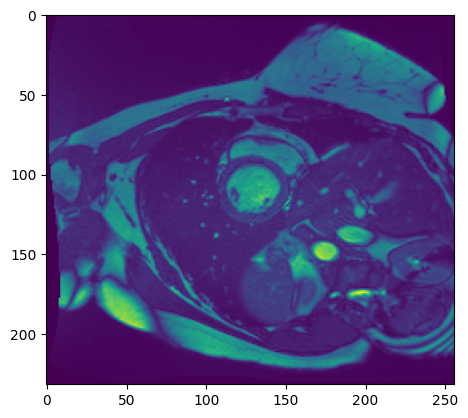

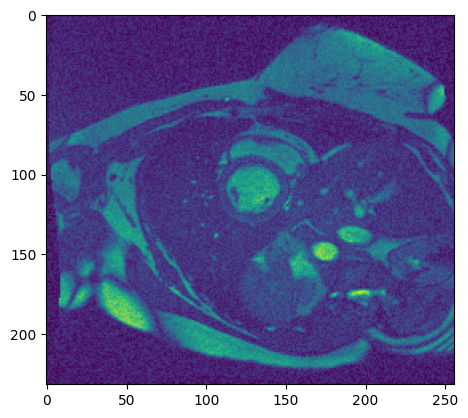

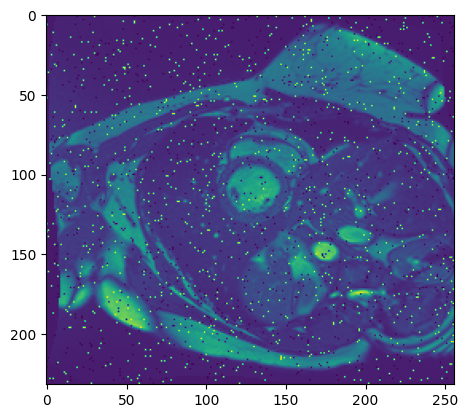

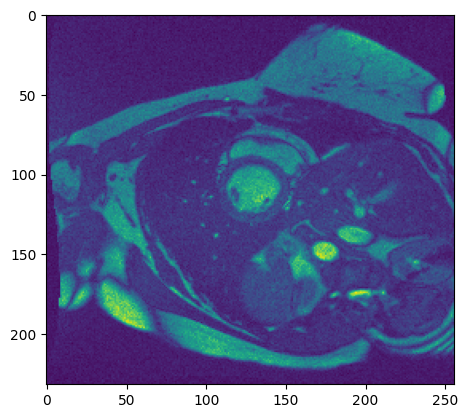

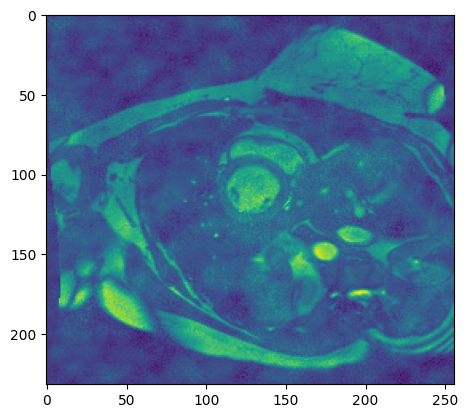

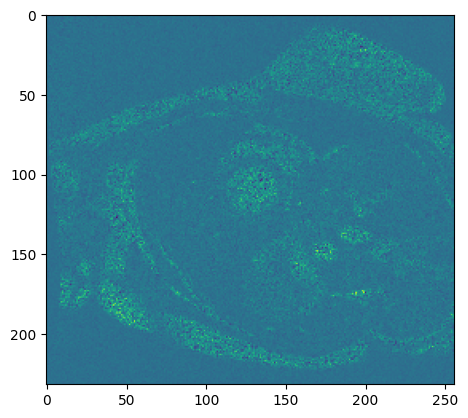

In [12]:
# Load the frame
im, affine, header = load_nii(os.path.join(path_testing, "patient101/patient101_frame14.nii.gz"))
print(im.shape)

# Show one slice (or all of them) of the frame 
im = im[:,:,3]
plt.imshow(im)
plt.show()
# for i in range(im.shape[2]):
#     plt.imshow(im[:,:,i])
#     plt.show()

# Add a gaussian noise to this frame
Im = add_noise_Gaussian(im)
plt.imshow(Im)
plt.show()

# Add a salt & pepper noise to the frame
Im = add_noise_SaltPepper(im)
plt.imshow(Im)
plt.show()

# Add a poisson noise to the frame
Im = add_noise_Poisson2(im)
plt.imshow(Im)
plt.show()

# Add a perlin noise to the frame
Im = add_noise_Perlin(im)
plt.imshow(Im)
plt.show()

# Add a speckle noise to the frame
Im = add_noise_Speckle(im)
plt.imshow(Im)
plt.show()

# Data Generation

### Dataset class

In [13]:
class cleanDataset(Dataset):

  def __init__(self,datasetclean,transform):
    self.clean = datasetclean
    self.transform = transform
  
  def __len__(self):
    return len(self.clean)
  
  def __getitem__(self,idx):
    xClean = self.clean[idx]
    
    if self.transform != None:
      xClean = self.transform(xClean)
    
    return (xClean)
  
  
class noisedDataset(Dataset):
    
  def __init__(self,datasetnoised,datasetclean,transform):
    self.noise = datasetnoised
    self.clean = datasetclean
    self.transform = transform
  
  def __len__(self):
    return len(self.noise)
  
  def __getitem__(self,idx):
    xNoise = self.noise[idx]
    xClean = self.clean[idx]
    
    if self.transform != None:
      xNoise = self.transform(xNoise)
      xClean = self.transform(xClean)
    
    return (xNoise, xClean)

### Database modification

In [14]:
def add_noisedData():
    for path in Path:
        for file in os.listdir(path):
            if file.startswith('patient'):
                for files in os.listdir(os.path.join(path, file + "/")):
                    if files.startswith(file + "_frame") and files.endswith('gt.nii.gz') == False:
                        
                        im, affine, header = load_nii(os.path.join(path, file + "/" + files))
                        
                        path_OutputFile = path + file + "/" + "noisy_" + files
                        
                        for i in range(im.shape[2]):
                            p = np.random.rand()
                            im[:,:,i] = add_noise2(im[:,:,i], p)
                        
                        save_nii(path_OutputFile, im, affine, header)

def remove_noisedData():
    for path in Path:
        for file in os.listdir(path):
            if file.startswith('patient'):
                for files in os.listdir(os.path.join(path, file + "/")):         
                    if files.startswith('noisy'):
                        os.remove(os.path.join(path, file + "/" + files))

In [15]:
remove_noisedData()

### Get the parameters of the data

In [16]:
def init_parameters():
    h_max = 0
    w_max = 0
    n  = 0
    n2 = 0
    n_tot  = 0
    n_tot2 = 0
    
    for path in Path:
        for file in os.listdir(path):
            if file.startswith('patient'):
                for files in os.listdir(os.path.join(path, file + "/")):
                    if files.startswith(file + "_frame") and files.endswith('gt.nii.gz') == False:
                        
                        im, _, _ = load_nii(os.path.join(path, file + "/" + files))
                        
                        if im.shape[0] > h_max:
                            h_max = im.shape[0]
                            
                        if im.shape[1] > w_max:
                            w_max = im.shape[1]
                        
                        if path == path_testing:
                            n += 1
                            n_tot += im.shape[2]
                        else:
                            n2 += 1
                            n_tot2 += im.shape[2]
                            
    n_tot3 = int(n_tot/3)
    n_tot = n_tot - n_tot3
    
    if h_max < w_max:
        h_max = w_max

    return h_max, n_tot, n_tot2, n_tot3

### Create the data arrays

In [17]:
def create_arraySet(size, test):
    
    h_max, n_tot, n_tot2, n_tot3 = init_parameters()
    w_max = h_max
    
    if size != 0:
        h_max = size
        w_max = size

    TEdata = np.zeros((n_tot, h_max, w_max))  # n_size / n_line / n_col
    TRdata = np.zeros((n_tot2, h_max, w_max))
    VAdata = np.zeros((n_tot3, h_max, w_max))
    
    if test == 'noisy':
        remove_noisedData()
        add_noisedData()
        
        TEnoisedData    = np.zeros((n_tot, h_max, w_max))
        TRnoisedData    = np.zeros((n_tot2, h_max, w_max))    
        VAnoisedData    = np.zeros((n_tot3, h_max, w_max))

    m_TE = 0
    m_TR = 0
    m_VA = 0
    m_TEnoised = 0
    m_TRnoised = 0
    m_VAnoised = 0

    counter  = 0
    counter2 = 0

    T = torchvision.transforms.ToTensor()

    for path in Path:
        for file in os.listdir(path):
            if file.startswith('patient'):
                for files in os.listdir(os.path.join(path, file + "/")):           
                    if (files.startswith(file + "_frame") or files.startswith('noisy')) and files.endswith('gt.nii.gz') == False:
                        
                        im, _, _ = load_nii(os.path.join(path, file + "/" + files))
                        
                        for k in range(im.shape[2]):
                    
                            Im = im[:,:,k].copy()
                            
                            if Im.shape[0] != h_max or Im.shape[1] != w_max:
                                Im = torchvision.transforms.Resize((h_max,w_max))(T(Im))
                                Im = np.moveaxis(Im.numpy()*255, 0, -1).squeeze()                        
                        
                            if files.startswith(file + "_frame"):
                                if path == path_testing and counter < n_tot3:
                                    VAdata[m_VA,:,:] = Im
                                    m_VA    += 1
                                    counter += 1
                                elif path == path_training:
                                    TRdata[m_TR,:,:] = Im
                                    m_TR += 1
                                else:
                                    TEdata[m_TE,:,:] = Im
                                    m_TE += 1
                                        
                            else:
                                if test == 'noisy':
                                    if path == path_testing and counter2 < n_tot3:
                                        VAnoisedData[m_VAnoised,:,:] = Im
                                        m_VAnoised += 1
                                        counter2   += 1
                                    elif path == path_training:
                                        TRnoisedData[m_TRnoised,:,:] = Im
                                        m_TRnoised += 1  
                                    else:
                                        TEnoisedData[m_TEnoised,:,:] = Im
                                        m_TEnoised += 1 
    
    if test == 'noisy':                      
        return TEdata, TRdata, VAdata, TEnoisedData, TRnoisedData, VAnoisedData
    
    return TEdata, TRdata, VAdata

### Create the data set / loader

In [18]:
def create_dataSet(size, test):
        
    transforms = torchvision.transforms.Compose([torchvision.transforms.ToTensor()])
    
    if test == 'noisy':
        TEdata, TRdata, VAdata, TEnoisedData, TRnoisedData, VAnoisedData = create_arraySet(size, test)
        
        TEnoisedSet = noisedDataset(TEnoisedData, TEdata, transforms)
        TRnoisedSet = noisedDataset(TRnoisedData, TRdata, transforms)
        VAnoisedSet = noisedDataset(VAnoisedData, VAdata, transforms)
        
        return TEnoisedSet, TRnoisedSet, VAnoisedSet
        
    TEdata, TRdata, VAdata = create_arraySet(size, test)

    TEset = cleanDataset(TEdata, transforms)
    TRset = cleanDataset(TRdata, transforms)
    VAset = cleanDataset(VAdata, transforms)        
    
    return TEset, TRset, VAset


def create_dataLoader(size, test, batch_size):
    
    if test == 'noisy':
        TEnoisedSet, TRnoisedSet, VAnoisedSet = create_dataSet(size, test)
        
        TEnoisedLoader = DataLoader(TEnoisedSet, batch_size=batch_size, shuffle=True)
        TRnoisedLoader = DataLoader(TRnoisedSet, batch_size=batch_size, shuffle=True)
        VAnoisedLoader = DataLoader(VAnoisedSet, batch_size=batch_size, shuffle=True)
        
        return None, None, None, TEnoisedLoader, TRnoisedLoader, VAnoisedLoader
    
    TEset, TRset, VAset = create_dataSet(size, test)
        
    TEloader = DataLoader(TEset, batch_size=batch_size, shuffle=True)
    TRloader = DataLoader(TRset, batch_size=batch_size, shuffle=True)
    VAloader = DataLoader(VAset, batch_size=batch_size, shuffle=True)
    
    return TEloader, TRloader, VAloader, None, None, None

### Save / Load the data arrays

In [19]:
def save(TEdata, TRdata, VAdata, TEnoisedData, TRnoisedData, VAnoisedData):
    np.save(os.path.join(path_tmpdata, "TEdata.npy"), TEdata)
    np.save(os.path.join(path_tmpdata, "TRdata.npy"), TRdata)
    np.save(os.path.join(path_tmpdata, "VAdata.npy"), VAdata)
    np.save(os.path.join(path_tmpdata, "TEnoisedData.npy"), TEnoisedData)
    np.save(os.path.join(path_tmpdata, "TRnoisedData.npy"), TRnoisedData)
    np.save(os.path.join(path_tmpdata, "VAnoisedData.npy"), VAnoisedData)
    

def load():
    TEdata = np.load(os.path.join(path_tmpdata, "TEdata.npy"), allow_pickle=True)
    TRdata = np.load(os.path.join(path_tmpdata, "TRdata.npy"), allow_pickle=True)
    VAdata = np.load(os.path.join(path_tmpdata, "VAdata.npy"), allow_pickle=True)
    TEnoisedData = np.load(os.path.join(path_tmpdata, "TEnoisedData.npy"), allow_pickle=True)
    TRnoisedData = np.load(os.path.join(path_tmpdata, "TRnoisedData.npy"), allow_pickle=True)
    VAnoisedData = np.load(os.path.join(path_tmpdata, "VAnoisedData.npy"), allow_pickle=True)
    
    return TEdata, TRdata, VAdata, TEnoisedData, TRnoisedData, VAnoisedData

## Loss functions

In [ ]:
def RMSE(inputs, outputs):
    loss = torch.sqrt(torch.sum(torch.square(inputs - outputs), axis=1) / (inputs.size()[1]))
    return torch.sum(loss) / inputs.size()[0]

class RMSELoss(nn.Module):
    def __init__(self, eps=1e-6):
        super(RMSELoss, self).__init__()
        self.mse = nn.MSELoss()
        self.eps = eps
        
    def forward(self, x, y):
        return torch.sqrt(self.mse(x, y) + self.eps)

In [ ]:
def PNSR(inputs, outputs, eps):
    return -10*torch.log10(torch.mean((inputs - outputs) ** 2, dim=[1, 2, 3]) + eps)

# Neural network
## Step 1

### GPU / CPU initialisation

In [20]:
if torch.cuda.is_available():
    print('use cuda')
    device = torch.device('cpu')
else:
    print('use CPU')
    device = torch.device('cpu')

use cuda


In [21]:
torch.cuda.empty_cache()
torch.cuda.get_device_name(0)
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from large pool |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from small pool |      0 B   |      0 B   |      0 B   |      0 B   |\n|---------------------------------------------------------------------------|\n| Active memory         |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from large pool |      0 B   |      0 B   |

### Auto-Encoder

In [34]:
class AEnet(nn.Module):
    """Auto-Encoder network"""
    def __init__(self):
        super(AEnet, self).__init__()
        self.name = 'autoencoder'
                
        Kernel = 3
        Padding = 1 #int((Kernel-1)/2)
        Stride = 1
        
        self.encoder = nn.Sequential(
            nn.Conv2d(1,64,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64,32,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(32,16,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(16,8,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(8,4,Kernel,Stride,Padding),
            nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            
            # nn.Flatten(start_dim=1),
            # nn.Linear(8*32*32, 2048),
            # nn.ReLU(True),
            # nn.Linear(2048, 512)
        )
        
        
        self.decoder = nn.Sequential(
            # nn.Linear(512, 2048),
            # nn.ReLU(True),
            # nn.Linear(2048  , 8*32*32),
            # nn.Unflatten(dim=1,unflattened_size=(8,32,32)),
            
            nn.ConvTranspose2d(4,4,2,stride=2),
            nn.ReLU(True),            
            nn.ConvTranspose2d(4,8,2,stride=2),
            nn.ReLU(True),
            nn.ConvTranspose2d(8,16,2,stride=2),
            nn.ReLU(True),
            nn.ConvTranspose2d(16,32,2,stride=2),
            nn.ReLU(True),
            nn.ConvTranspose2d(32,64,2,stride=2),
            nn.ReLU(True),
            nn.Conv2d(64,1,Kernel,Stride,Padding),
            nn.Sigmoid()
        )
    
    def forward(self,x):
        x = self.encoder(x)
        x = self.decoder(x)
        
        return x     

### Network test

In [35]:
net = AEnet()

size = 512
summary(net, (1, size, size), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]             640
              ReLU-2         [-1, 64, 512, 512]               0
         MaxPool2d-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 32, 256, 256]          18,464
              ReLU-5         [-1, 32, 256, 256]               0
         MaxPool2d-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 16, 128, 128]           4,624
              ReLU-8         [-1, 16, 128, 128]               0
         MaxPool2d-9           [-1, 16, 64, 64]               0
           Conv2d-10            [-1, 8, 64, 64]           1,160
             ReLU-11            [-1, 8, 64, 64]               0
        MaxPool2d-12            [-1, 8, 32, 32]               0
           Conv2d-13            [-1, 4, 32, 32]             292
             ReLU-14            [-1, 4,

## Step 2
### Train

In [24]:
def count_parameters(model):
    return (sum([p.numel() for p in model.parameters() if p.requires_grad]))

def init_params(net):
    '''Init layer parameters.'''
    for m in net.modules():
        if isinstance(m, nn.Conv2d):
            init.kaiming_normal_(m.weight, mode='fan_out')
            
        elif isinstance(m, nn.BatchNorm2d):
            init.constant_(m.weight, 1)
            init.constant_(m.bias, 0)
            
        elif isinstance(m, nn.Linear):
            init.normal_(m.weight, std=1e-3)
            init.constant_(m.bias, 0) 

In [25]:
def normalize(inputs):
    flattened_outmap = inputs.view(inputs.shape[0], -1, 1, 1) # Use 1's to preserve the number of dimensions for broadcasting later, as explained
    outmap_min, _ = torch.min(flattened_outmap, dim=1, keepdim=True)
    outmap_max, _ = torch.max(flattened_outmap, dim=1, keepdim=True)
    inputs = (inputs - outmap_min) / (outmap_max - outmap_min)
    return inputs


def plot(inputs, size, test_img, idx, axe, i):
    inputs = inputs[test_img[idx],:,:]
    
    inputs = inputs.view(1,size,size)
    inputs = inputs.permute(1,2,0).squeeze(2)
    inputs = inputs.detach().cpu().numpy()
    
    axe[idx,i].imshow(inputs, cmap="gray")
    
    
def plot_ae_outputs_den(net, testingLoader, testingLoader_noisy, size, n, n_tot3, batch_size, test, noise_factor):
    
    _, axes = plt.subplots(n,3,figsize=(10,10))
    axes[0,0].set_title("Original Image")
    axes[0,1].set_title("Dirty Image")
    axes[0,2].set_title("Cleaned Image")

    test_imgs  = np.random.randint(0,int(n_tot3/batch_size),size=n)
    test_imgs2 = np.random.randint(0,batch_size-1,size=n)

    for idx in range((n)):
        count = 0
        
        if test == 'noisy':
            for inputs, targets in testingLoader_noisy:
                if test_imgs[idx] == count:
                    
                    inputs  = normalize(inputs)
                    targets = normalize(targets)
        
                    inputs  = inputs.type(torch.FloatTensor)
                    targets = targets.type(torch.FloatTensor)
                    
                    net.eval()
                    
                    with torch.no_grad():
                        outputs = net(targets)
                        break
            
                count += 1
                
        else:
            for inputs in testingLoader:
                if test_imgs[idx] == count:
                    
                    inputs  = normalize(inputs)
                    targets = add_noise3(inputs, noise_factor)
        
                    inputs  = inputs.type(torch.FloatTensor)
                    targets = targets.type(torch.FloatTensor)
                    
                    net.eval()
                    
                    with torch.no_grad():
                        outputs = net(targets)
                        break
            
                count += 1

        plot(inputs, size, test_imgs2, idx, axes, 0)
        plot(targets, size, test_imgs2, idx, axes, 1)
        plot(outputs, size, test_imgs2, idx, axes, 2)

    plt.show()

#### Training function

In [26]:
def training(net, TRloader, TRnoisedLoader, criterion, optimizer, test, noise_factor, losses_TRAll, losses_TRAll2):
    
    net.train()
    
    # lr = lr0 * lr_gamma**int(epoch/lr_step)
    # optimizer.lr = lr
    # print (lr)
    
    TRlosses  = []
    TRlosses2 = []
    
    start = time.time()

    if test == 'noisy':
        for inputs, targets in tqdm.tqdm((TRnoisedLoader)):
        
            inputs  = normalize(inputs)
            targets = normalize(targets)
            
            inputs  = inputs.type(torch.FloatTensor)
            targets = targets.type(torch.FloatTensor)
            
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = net(targets)
            loss = criterion(outputs, inputs)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            TRlosses.append(loss.data.item())
            TRlosses2.append(loss.detach().cpu().numpy())    
            
            losses_TRAll.append(loss.data.item())
            losses_TRAll2.append(loss.detach().cpu().numpy()) 
            
    else:
        for inputs in tqdm.tqdm((TRloader)):
        
            inputs  = normalize(inputs)
            targets = add_noise3(inputs, noise_factor)
            
            inputs  = inputs.type(torch.FloatTensor)
            targets = targets.type(torch.FloatTensor)
            
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = net(targets)
            loss = criterion(outputs, inputs)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            TRlosses.append(loss.data.item())
            TRlosses2.append(loss.detach().cpu().numpy())    
            
            losses_TRAll.append(loss.data.item())
            losses_TRAll2.append(loss.detach().cpu().numpy()) 
        
    end = time.time()
    
    return TRlosses, TRlosses2, end-start

#### Validation function

In [27]:
def validation(net, VAloader, VAnoisedLoader, criterion, test, noise_factor):
    
    # Evaluate the current network on the validation dataset
    net.eval()
    
    VAlosses = []
    start = time.time()
    
    with torch.no_grad():
        conc_out = []
        conc_label = [] 
        
        if test == 'noisy':    
            for inputs, targets in tqdm.tqdm((VAnoisedLoader)):
                
                inputs  = normalize(inputs)
                targets = normalize(targets)
                
                inputs  = inputs.type(torch.FloatTensor)
                targets = targets.type(torch.FloatTensor)
                
                inputs, targets = inputs.to(device), targets.to(device)

                outputs = net(targets)
                
                loss = criterion(outputs, inputs)
                VAlosses.append(loss.data.item())    
                
                conc_out.append(outputs.cpu())
                conc_label.append(inputs.cpu())
        
        else:
            for inputs in tqdm.tqdm((VAloader)):
                
                inputs  = normalize(inputs)
                targets = add_noise3(inputs, noise_factor)
                
                inputs  = inputs.type(torch.FloatTensor)
                targets = targets.type(torch.FloatTensor)
                
                inputs, targets = inputs.to(device), targets.to(device)

                outputs = net(targets)
                
                loss = criterion(outputs, inputs)
                VAlosses.append(loss.data.item())    
                
                conc_out.append(outputs.cpu())
                conc_label.append(inputs.cpu())
        
        conc_out   = torch.cat(conc_out)
        conc_label = torch.cat(conc_label)
        val_loss = criterion(conc_out, conc_label)
        
    end = time.time()
    
    VAlosses2 = val_loss.data
    
    return VAlosses, VAlosses2, end-start

#### Testing function

In [28]:
def testing(net, testingLoader, testingLoader_noisy, criterion, test, noise_factor):

    net.eval()
    
    TElosses = []
    start = time.time()

    with torch.no_grad():
        if test == 'noisy':
            for inputs, targets in tqdm.tqdm((testingLoader_noisy)):

                inputs  = normalize(inputs)
                targets = normalize(targets)
                
                inputs  = inputs.type(torch.FloatTensor)
                targets = targets.type(torch.FloatTensor)
                
                inputs, targets = inputs.to(device), targets.to(device)

                outputs = net(inputs)
                loss = criterion(outputs, targets)
                TElosses.append(loss.data.item())
                
        else:
            for inputs in tqdm.tqdm((testingLoader)):

                inputs = normalize(inputs)
                targets = add_noise3(inputs, noise_factor)
                
                inputs  = inputs.type(torch.FloatTensor)
                targets = targets.type(torch.FloatTensor)
                
                inputs, targets = inputs.to(device), targets.to(device)

                outputs = net(inputs)
                loss = criterion(outputs, targets)
                TElosses.append(loss.data.item())
                
    end = time.time()
    
    return TElosses, end-start

#### Initialisation

In [37]:
net = AEnet()

init_params(net)

lr0 = 1e-3

test_name = net.name + '_lr0_' + "{:.1e}".format(lr0)
print(test_name)

net = net.to(device)

optimizer = torch.optim.Adam(net.parameters(), lr=lr0, weight_decay=1e-5)
criterion = nn.MSELoss()

lr_step  = 5
lr_gamma = 0.1

autoencoder_lr0_1.0e-03


In [38]:
test = 'noisy'
test = 'clean'

size = 256
batch_size = 16
noise_factor = 0.3

In [31]:
TEloader, TRloader, VAloader, TEnoisedLoader, TRnoisedLoader, VAnoisedLoader = create_dataLoader(size=size, test=test, batch_size=batch_size)

c:\Users\Virgile DALAUD\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [39]:
losses_TR   = []
losses_TR2  = []
losses_TRAll  = []
losses_TRAll2 = []
losses_TE   = []
losses_VA   = []
losses_VA2  = []
idxEpoch    = [0]
bestAcc     = 0

_, _, _, n_tot3 = init_parameters()
n = 2
epochs = 20

#### Training cycle

100%|██████████| 119/119 [03:20<00:00,  1.68s/it]


Epoch : 0 	 Train Loss : 0.042 or 0.041749 	 time: 200.107


100%|██████████| 23/23 [00:16<00:00,  1.43it/s]


Epoch : 0 	 Val Loss : 0.033 or 0.032562 	 Test Acc : 31813274.000000 	 time: 16.079


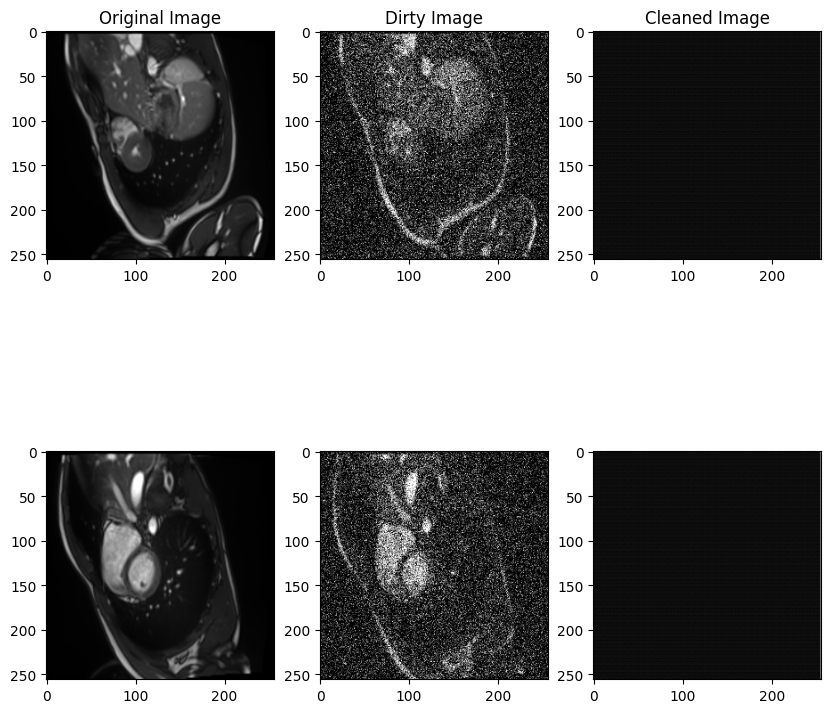

--------------------------------------------------------------


100%|██████████| 119/119 [03:18<00:00,  1.67s/it]


Epoch : 1 	 Train Loss : 0.027 or 0.026900 	 time: 198.752


100%|██████████| 23/23 [00:16<00:00,  1.40it/s]


Epoch : 1 	 Val Loss : 0.019 or 0.018650 	 Test Acc : 31813274.000000 	 time: 16.481


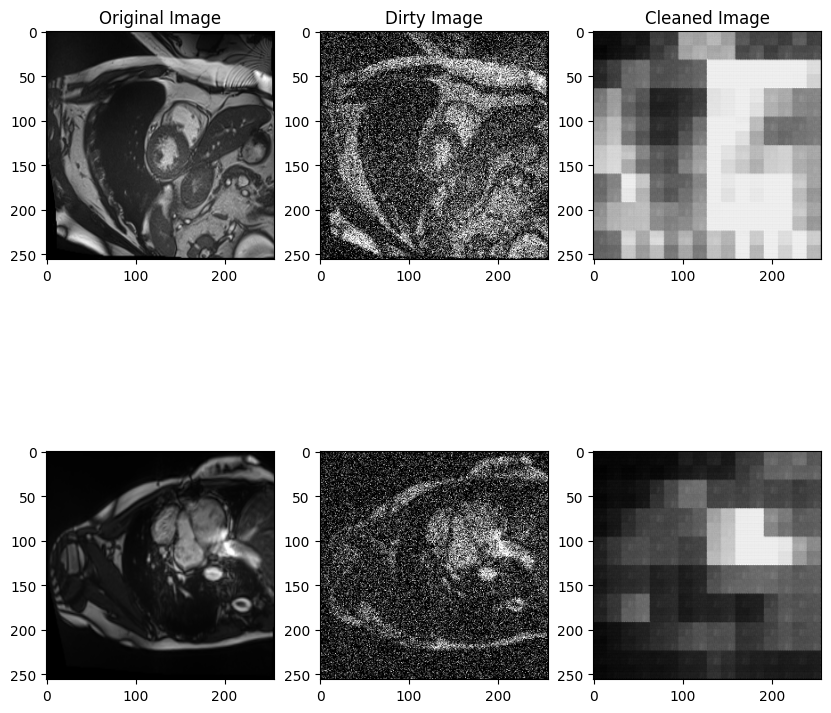

--------------------------------------------------------------


100%|██████████| 119/119 [03:16<00:00,  1.65s/it]


Epoch : 2 	 Train Loss : 0.017 or 0.016568 	 time: 196.157


100%|██████████| 23/23 [00:16<00:00,  1.38it/s]


Epoch : 2 	 Val Loss : 0.016 or 0.015874 	 Test Acc : 31813274.000000 	 time: 16.712


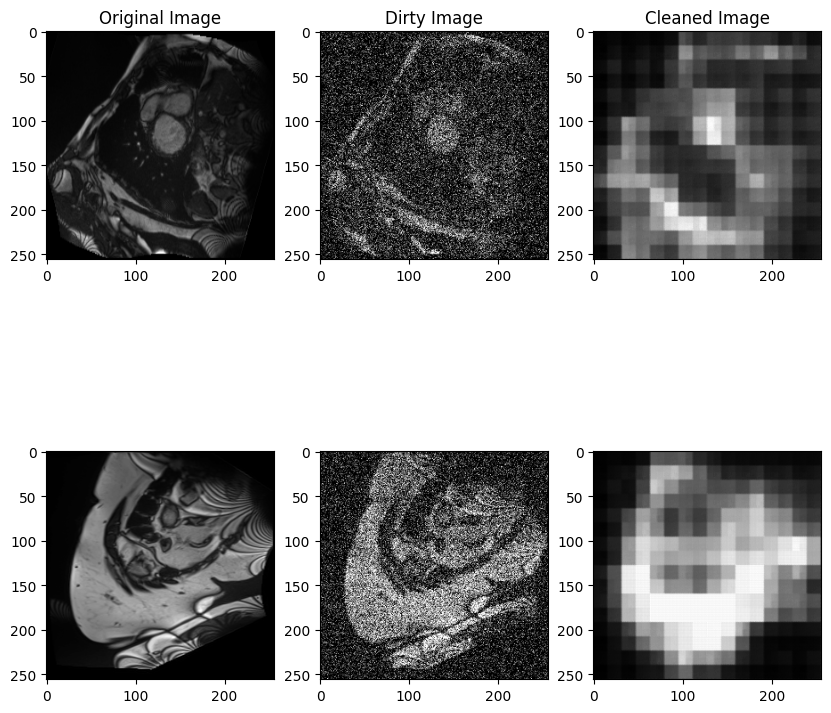

--------------------------------------------------------------


100%|██████████| 119/119 [03:18<00:00,  1.67s/it]


Epoch : 3 	 Train Loss : 0.015 or 0.014903 	 time: 198.357


100%|██████████| 23/23 [00:16<00:00,  1.36it/s]


Epoch : 3 	 Val Loss : 0.015 or 0.014876 	 Test Acc : 31831956.000000 	 time: 17.019


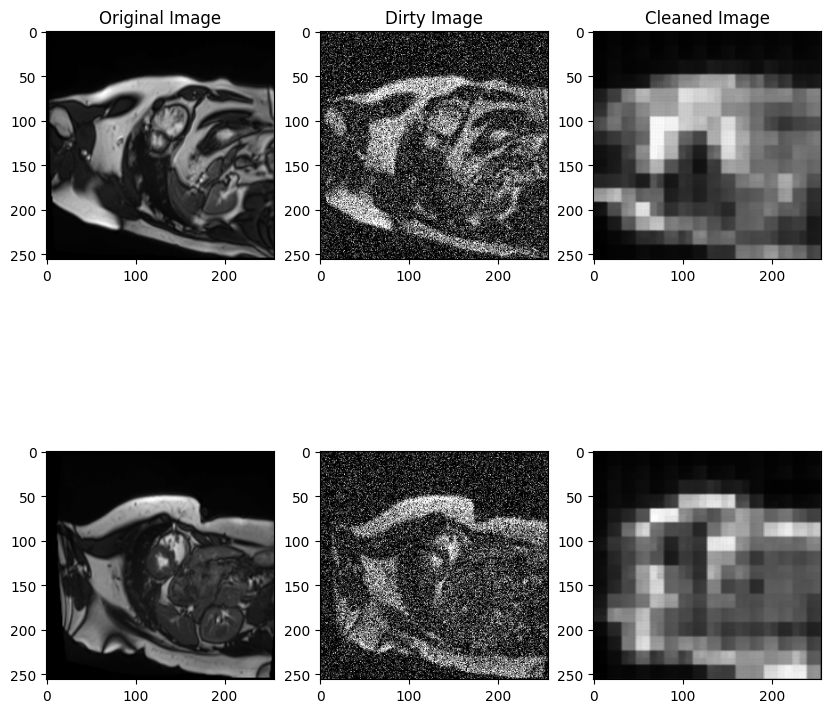

--------------------------------------------------------------


100%|██████████| 119/119 [03:17<00:00,  1.66s/it]


Epoch : 4 	 Train Loss : 0.014 or 0.014173 	 time: 197.030


100%|██████████| 23/23 [00:18<00:00,  1.27it/s]


Epoch : 4 	 Val Loss : 0.014 or 0.014260 	 Test Acc : 31831956.000000 	 time: 18.101


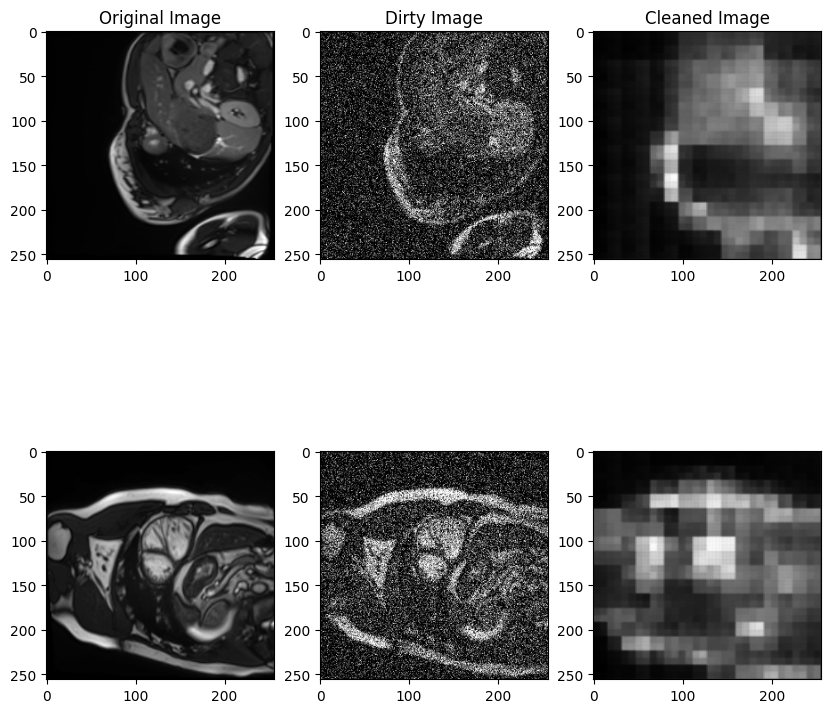

--------------------------------------------------------------


100%|██████████| 119/119 [03:18<00:00,  1.67s/it]


Epoch : 5 	 Train Loss : 0.014 or 0.013841 	 time: 198.500


100%|██████████| 23/23 [00:16<00:00,  1.36it/s]


Epoch : 5 	 Val Loss : 0.014 or 0.014009 	 Test Acc : 31842402.000000 	 time: 17.000


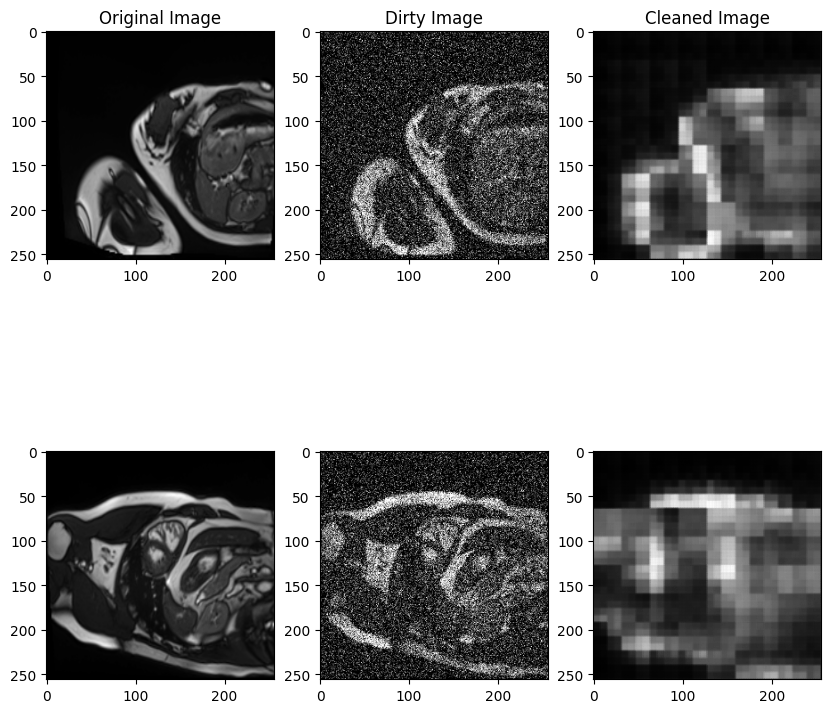

--------------------------------------------------------------


100%|██████████| 119/119 [03:19<00:00,  1.68s/it]


Epoch : 6 	 Train Loss : 0.014 or 0.013577 	 time: 199.368


100%|██████████| 23/23 [00:16<00:00,  1.37it/s]


Epoch : 6 	 Val Loss : 0.014 or 0.014064 	 Test Acc : 31842402.000000 	 time: 16.837


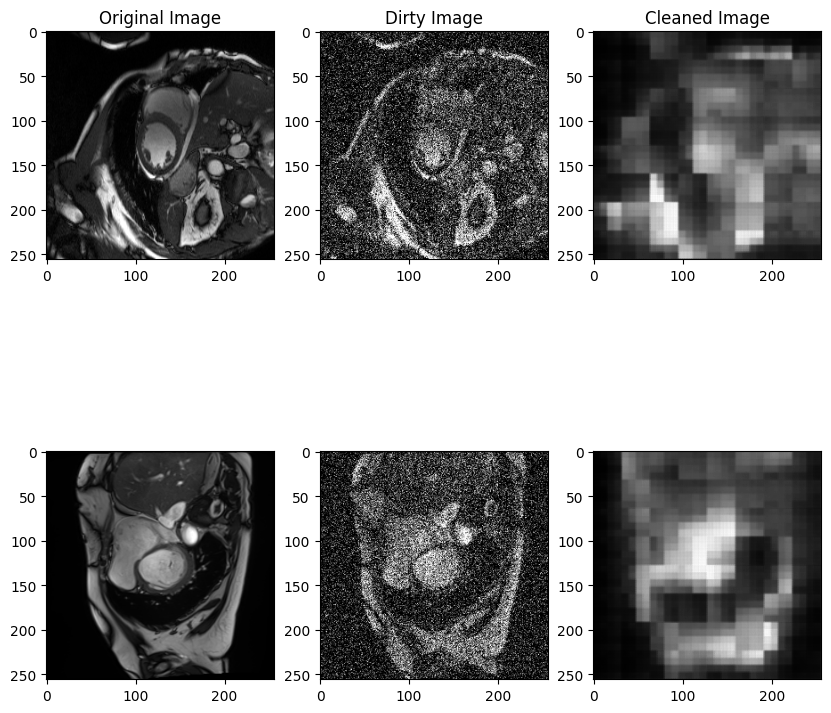

--------------------------------------------------------------


100%|██████████| 119/119 [03:19<00:00,  1.68s/it]


Epoch : 7 	 Train Loss : 0.013 or 0.013348 	 time: 199.366


100%|██████████| 23/23 [00:16<00:00,  1.37it/s]


Epoch : 7 	 Val Loss : 0.014 or 0.013468 	 Test Acc : 31842532.000000 	 time: 16.886


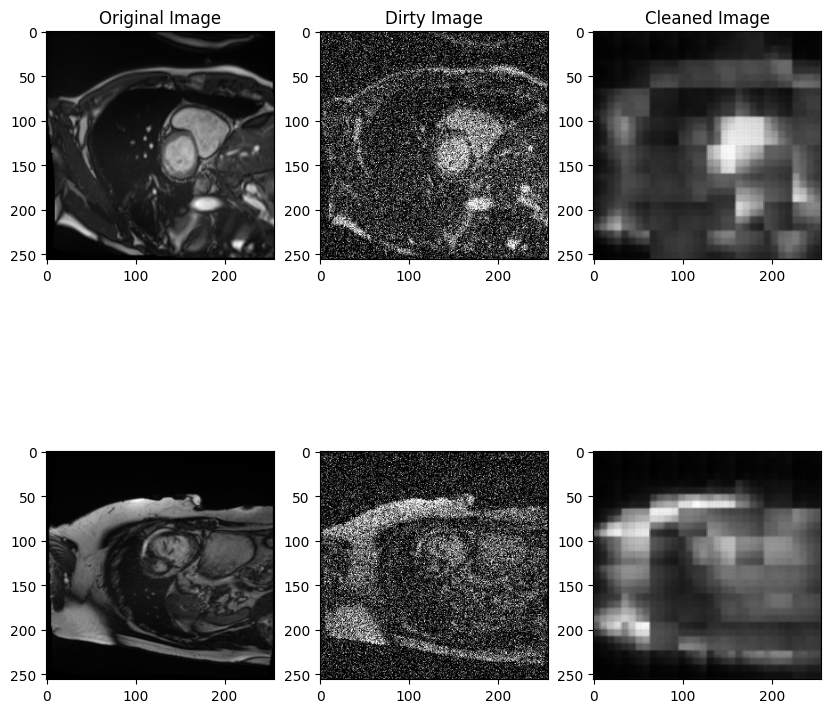

--------------------------------------------------------------


100%|██████████| 119/119 [03:17<00:00,  1.66s/it]


Epoch : 8 	 Train Loss : 0.013 or 0.013272 	 time: 197.757


100%|██████████| 23/23 [00:16<00:00,  1.41it/s]


Epoch : 8 	 Val Loss : 0.013 or 0.013418 	 Test Acc : 31842532.000000 	 time: 16.402


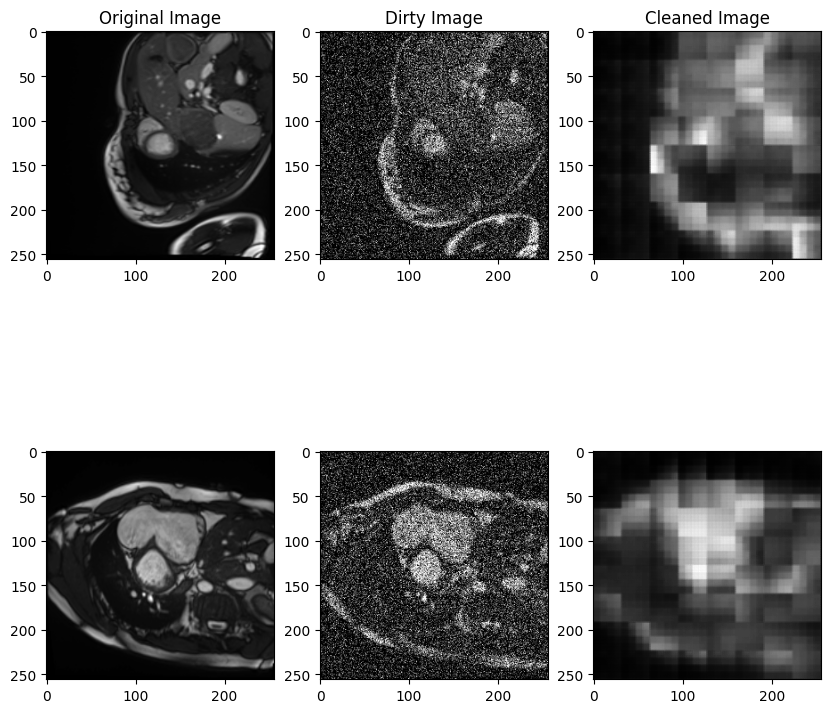

--------------------------------------------------------------


100%|██████████| 119/119 [03:24<00:00,  1.72s/it]


Epoch : 9 	 Train Loss : 0.013 or 0.013115 	 time: 204.772


100%|██████████| 23/23 [00:17<00:00,  1.32it/s]


Epoch : 9 	 Val Loss : 0.013 or 0.013384 	 Test Acc : 31842532.000000 	 time: 17.470


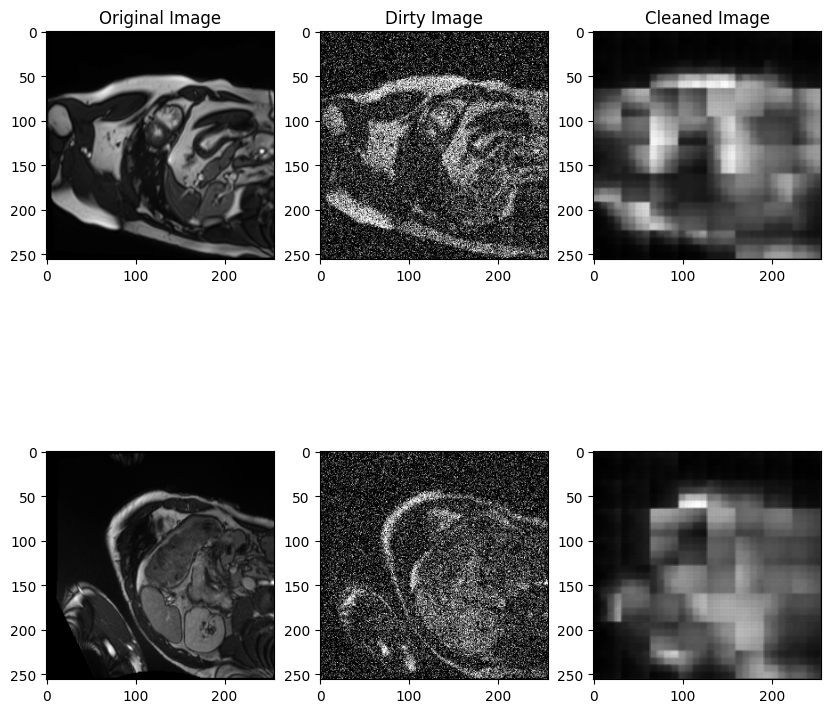

--------------------------------------------------------------


100%|██████████| 119/119 [03:30<00:00,  1.77s/it]


Epoch : 10 	 Train Loss : 0.013 or 0.013061 	 time: 210.165


100%|██████████| 23/23 [00:16<00:00,  1.39it/s]


Epoch : 10 	 Val Loss : 0.013 or 0.013204 	 Test Acc : 31842532.000000 	 time: 16.551


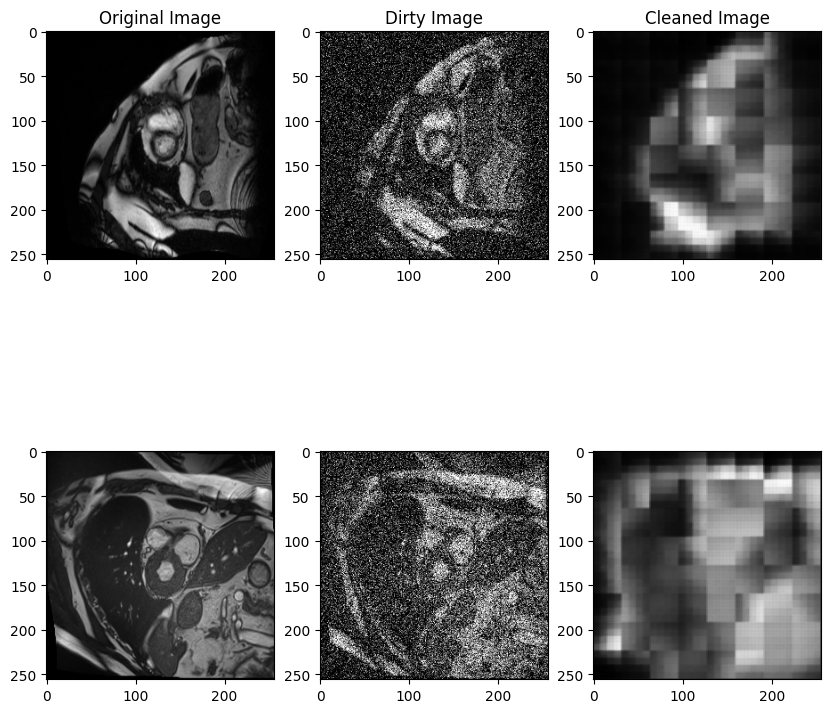

--------------------------------------------------------------


100%|██████████| 119/119 [03:58<00:00,  2.00s/it]


Epoch : 11 	 Train Loss : 0.013 or 0.012965 	 time: 238.531


100%|██████████| 23/23 [00:16<00:00,  1.39it/s]


Epoch : 11 	 Val Loss : 0.013 or 0.013119 	 Test Acc : 31842532.000000 	 time: 16.639


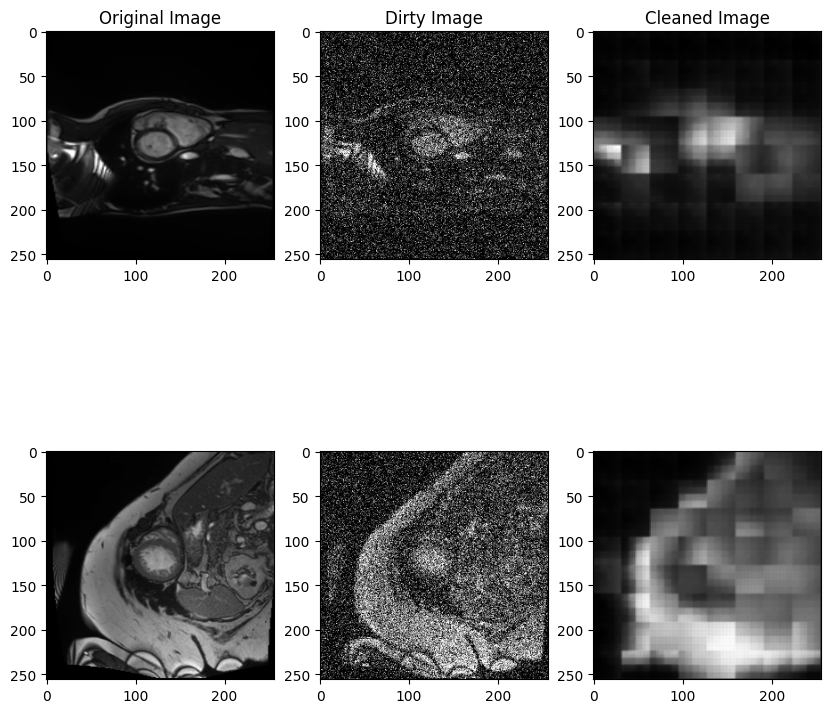

--------------------------------------------------------------


100%|██████████| 119/119 [04:36<00:00,  2.32s/it]


Epoch : 12 	 Train Loss : 0.013 or 0.012898 	 time: 276.437


100%|██████████| 23/23 [00:30<00:00,  1.32s/it]


Epoch : 12 	 Val Loss : 0.013 or 0.013177 	 Test Acc : 31842532.000000 	 time: 30.441


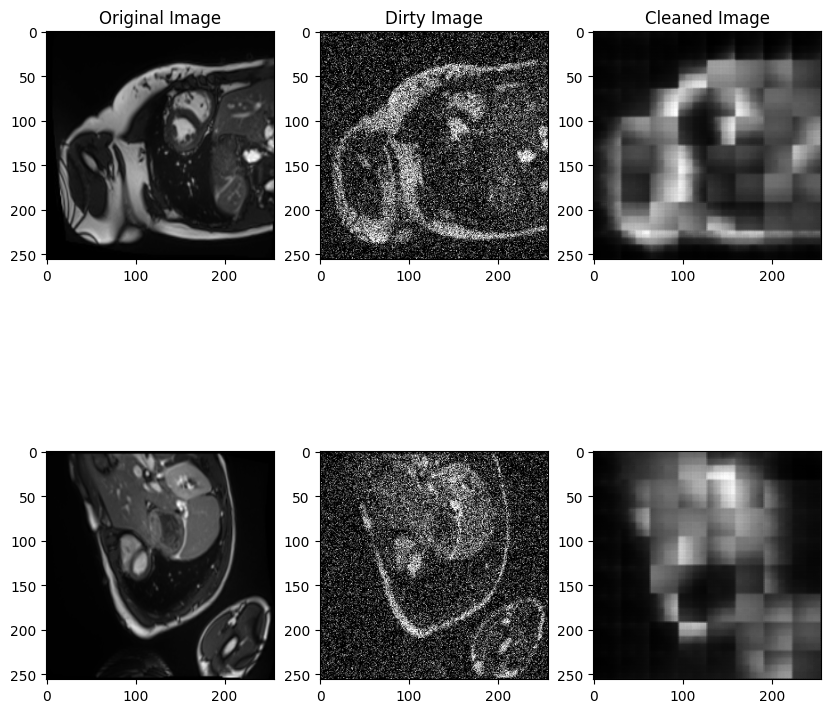

--------------------------------------------------------------


100%|██████████| 119/119 [06:42<00:00,  3.38s/it]


Epoch : 13 	 Train Loss : 0.013 or 0.012909 	 time: 402.773


100%|██████████| 23/23 [00:40<00:00,  1.76s/it]


Epoch : 13 	 Val Loss : 0.013 or 0.013051 	 Test Acc : 31842532.000000 	 time: 40.529


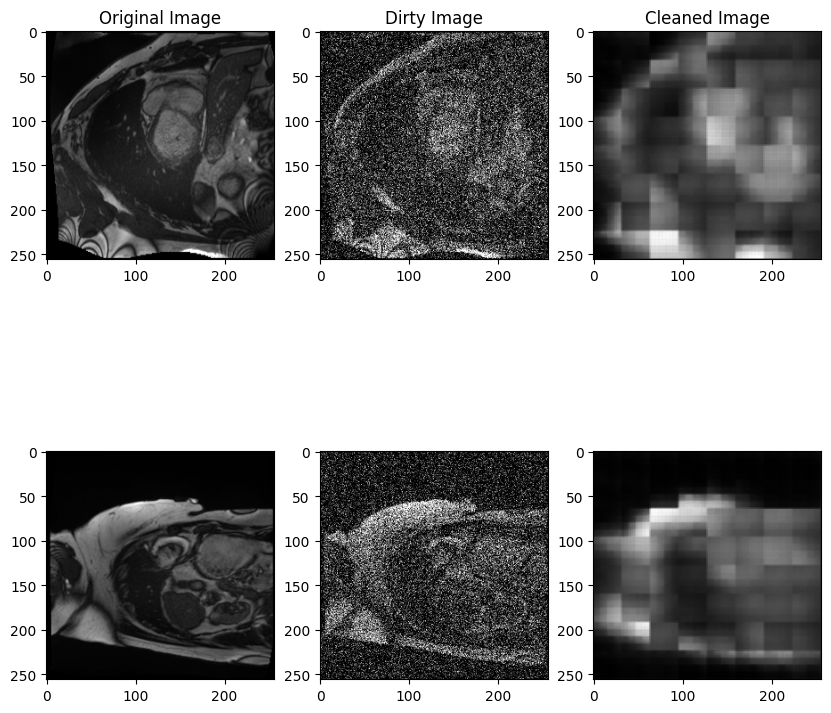

--------------------------------------------------------------


100%|██████████| 119/119 [06:34<00:00,  3.32s/it]


Epoch : 14 	 Train Loss : 0.013 or 0.012827 	 time: 394.669


100%|██████████| 23/23 [00:40<00:00,  1.78s/it]


Epoch : 14 	 Val Loss : 0.013 or 0.012998 	 Test Acc : 31842532.000000 	 time: 41.008


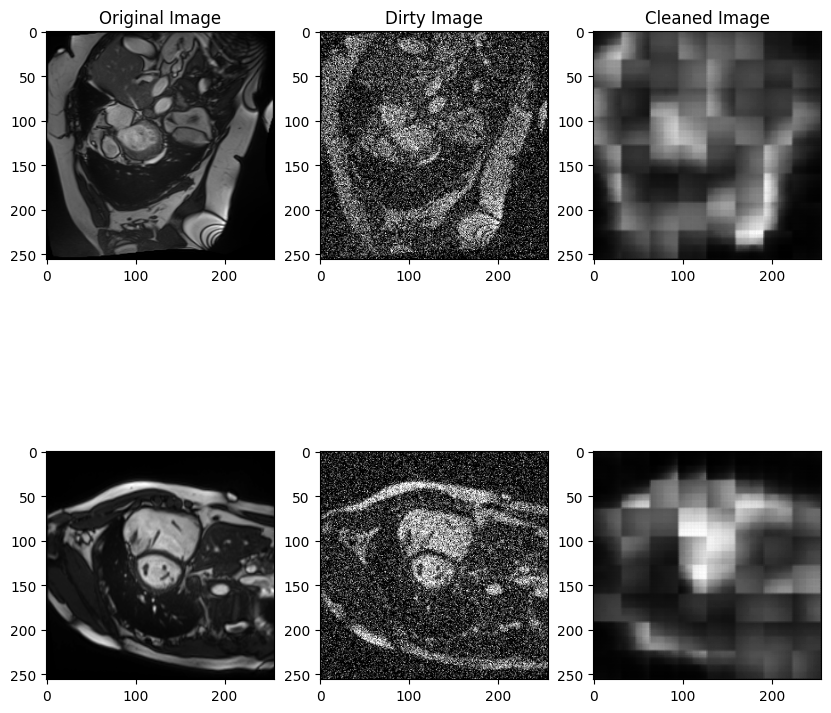

--------------------------------------------------------------


100%|██████████| 119/119 [06:42<00:00,  3.38s/it]


Epoch : 15 	 Train Loss : 0.013 or 0.012803 	 time: 402.253


100%|██████████| 23/23 [00:41<00:00,  1.79s/it]


Epoch : 15 	 Val Loss : 0.013 or 0.013000 	 Test Acc : 31842532.000000 	 time: 41.105


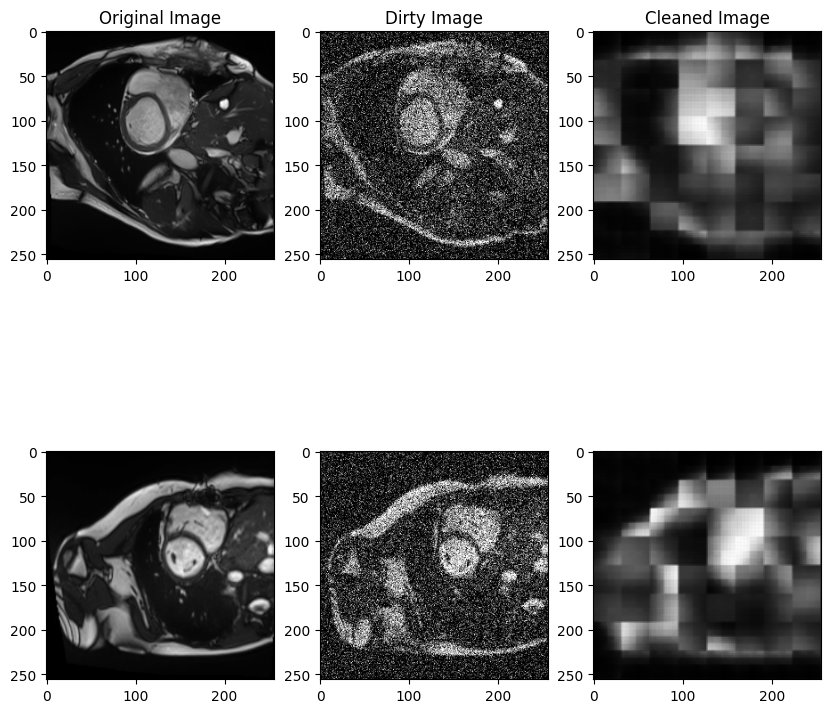

--------------------------------------------------------------


100%|██████████| 119/119 [07:07<00:00,  3.59s/it]


Epoch : 16 	 Train Loss : 0.013 or 0.012717 	 time: 427.231


100%|██████████| 23/23 [00:43<00:00,  1.91s/it]


Epoch : 16 	 Val Loss : 0.013 or 0.012909 	 Test Acc : 31842532.000000 	 time: 43.945


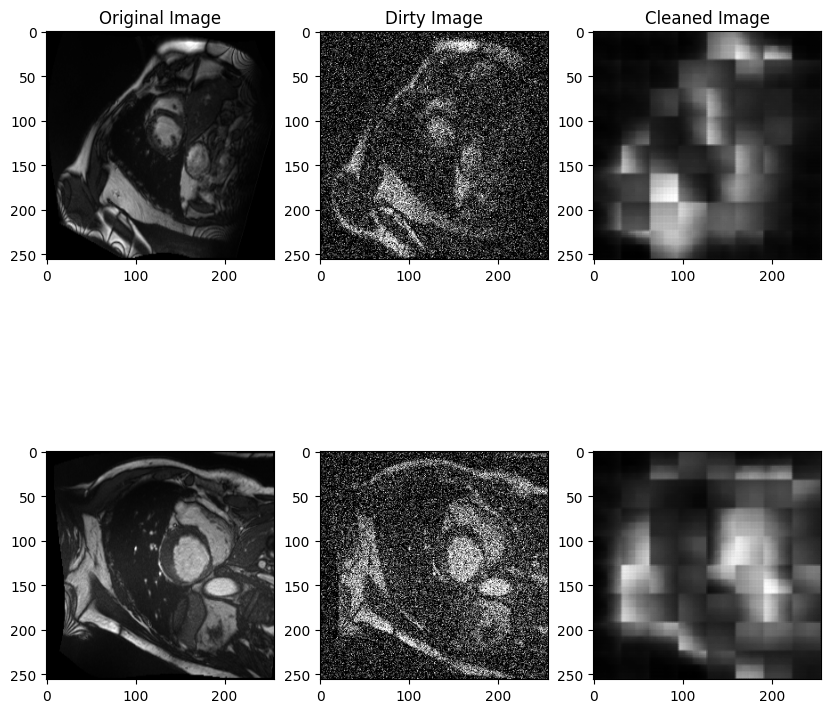

--------------------------------------------------------------


100%|██████████| 119/119 [07:08<00:00,  3.60s/it]


Epoch : 17 	 Train Loss : 0.013 or 0.012700 	 time: 428.923


100%|██████████| 23/23 [00:44<00:00,  1.92s/it]


Epoch : 17 	 Val Loss : 0.013 or 0.013072 	 Test Acc : 31842532.000000 	 time: 44.211


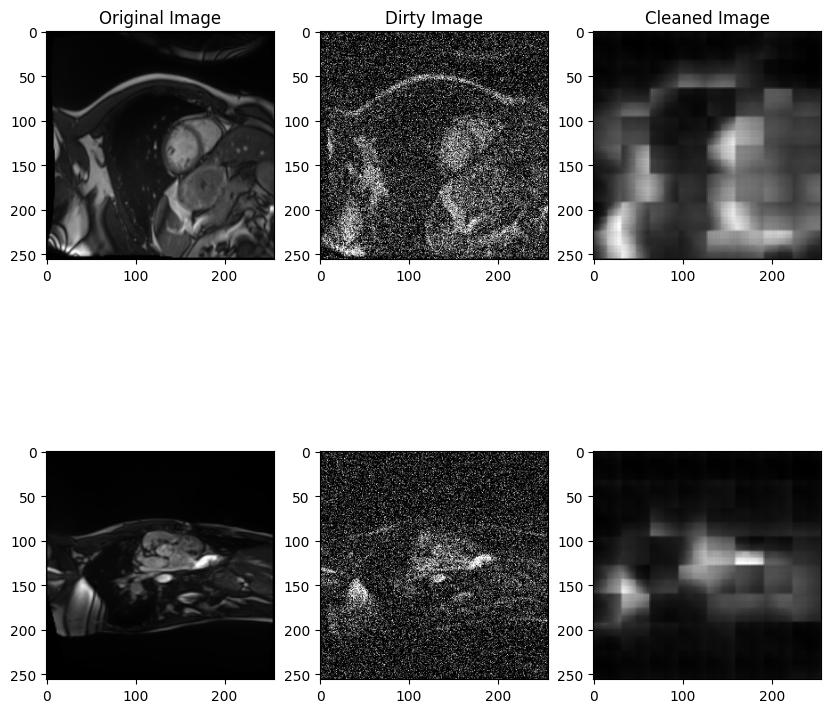

--------------------------------------------------------------


100%|██████████| 119/119 [07:08<00:00,  3.60s/it]


Epoch : 18 	 Train Loss : 0.013 or 0.012674 	 time: 428.225


100%|██████████| 23/23 [00:41<00:00,  1.82s/it]


Epoch : 18 	 Val Loss : 0.013 or 0.013258 	 Test Acc : 31842532.000000 	 time: 41.794


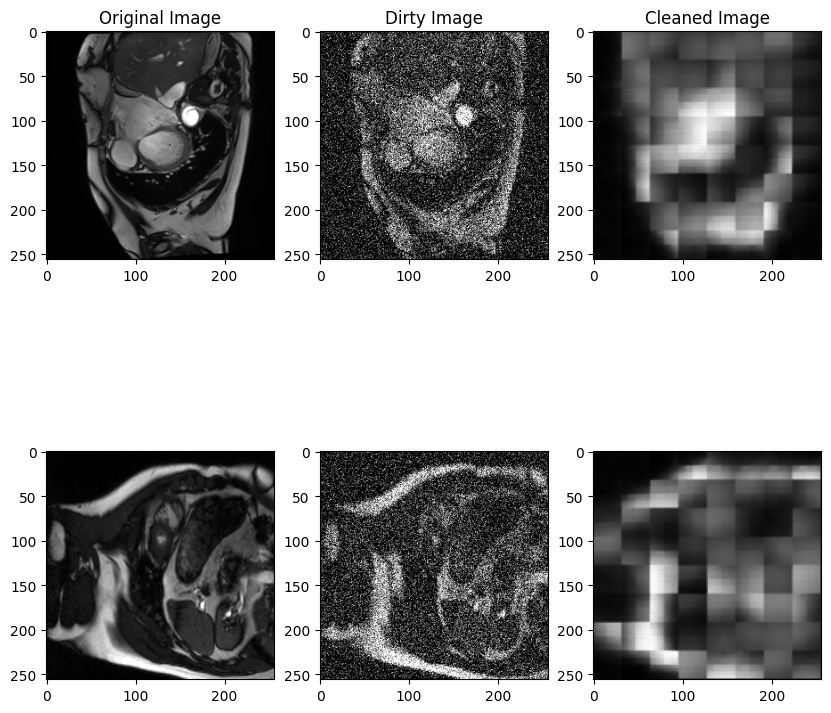

--------------------------------------------------------------


100%|██████████| 119/119 [06:54<00:00,  3.48s/it]


Epoch : 19 	 Train Loss : 0.013 or 0.012686 	 time: 414.349


100%|██████████| 23/23 [00:41<00:00,  1.82s/it]


Epoch : 19 	 Val Loss : 0.013 or 0.012849 	 Test Acc : 31842532.000000 	 time: 41.932


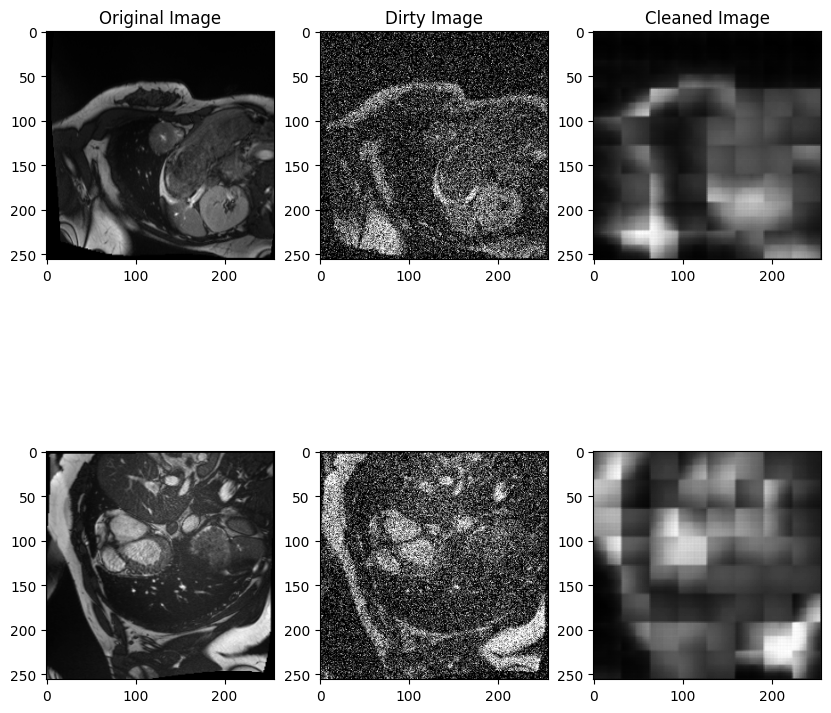

--------------------------------------------------------------


In [40]:
for epoch in range(epochs):
        
    TRlosses, TRlosses2, timer = training(net, TRloader, TRnoisedLoader, criterion, optimizer, test, noise_factor, losses_TRAll, losses_TRAll2)
    
    losses_TR.append(np.mean(TRlosses))
    losses_TR2.append(np.mean(TRlosses2))
    idxEpoch.append(idxEpoch[-1] + len(TRlosses))
    print('Epoch : %d \t Train Loss : %.3f or %3f \t time: %.3f' % (epoch, np.mean(TRlosses), np.mean(TRlosses2), timer))
    
    
    VAlosses, VAlosses2, timer = validation(net, VAloader, VAnoisedLoader, criterion, test, noise_factor)
    
    losses_VA.append(np.mean(VAlosses))
    losses_VA2.append(VAlosses2)
    print('Epoch : %d \t Val Loss : %.3f or %3f \t time: %.3f' % (epoch, np.mean(VAlosses), VAlosses2, timer))
    plot_ae_outputs_den(net, TEloader, TEnoisedLoader, size, n, n_tot3, batch_size, test, noise_factor)
    print('--------------------------------------------------------------')

#### Testing cycle

In [41]:
for epoch in range(epochs):
    TElosses, timer = testing(net, TEloader, TEnoisedLoader, criterion, test, noise_factor)
    
    losses_TE.append(np.mean(TElosses))
    print('Epoch : %d \t Test Loss : %3f \t time : %3f' % (epoch, np.mean(TElosses), timer))
    print('--------------------------------------------------------------')

100%|██████████| 45/45 [01:19<00:00,  1.77s/it]


Epoch : 0 	 Test Loss : 0.069910 	 time : 79.435157
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.82s/it]


Epoch : 1 	 Test Loss : 0.069901 	 time : 82.018992
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.81s/it]


Epoch : 2 	 Test Loss : 0.069863 	 time : 81.480802
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.81s/it]


Epoch : 3 	 Test Loss : 0.069862 	 time : 81.401678
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 4 	 Test Loss : 0.069908 	 time : 82.305957
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.84s/it]


Epoch : 5 	 Test Loss : 0.069913 	 time : 82.892117
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 6 	 Test Loss : 0.069900 	 time : 82.378313
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.81s/it]


Epoch : 7 	 Test Loss : 0.069887 	 time : 81.625765
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.81s/it]


Epoch : 8 	 Test Loss : 0.069942 	 time : 81.662165
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 9 	 Test Loss : 0.069882 	 time : 82.361297
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 10 	 Test Loss : 0.069887 	 time : 82.448757
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]


Epoch : 11 	 Test Loss : 0.069899 	 time : 81.903026
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 12 	 Test Loss : 0.069888 	 time : 82.473112
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]


Epoch : 13 	 Test Loss : 0.069891 	 time : 81.923353
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]


Epoch : 14 	 Test Loss : 0.069900 	 time : 82.216916
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.84s/it]


Epoch : 15 	 Test Loss : 0.069915 	 time : 82.637573
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]


Epoch : 16 	 Test Loss : 0.069933 	 time : 81.905389
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.82s/it]


Epoch : 17 	 Test Loss : 0.069908 	 time : 81.844662
--------------------------------------------------------------


100%|██████████| 45/45 [01:21<00:00,  1.81s/it]


Epoch : 18 	 Test Loss : 0.069887 	 time : 81.576640
--------------------------------------------------------------


100%|██████████| 45/45 [01:22<00:00,  1.83s/it]

Epoch : 19 	 Test Loss : 0.069884 	 time : 82.485771
--------------------------------------------------------------


## Step 3
### Plot learning curves

In [42]:
dlossesTR     = {}
dlossesTR2    = {}
dlossesTRAll  = {}
dlossesTRAll2 = {}
dlossesVA     = {}
dlossesVA2    = {}
dlossesTE     = {}
didxEpoch     = {}
dbestAcc      = {}
dnbParam      = {}

----------------------------------------------------------------------------
----------------------------------------------------------------------------
----------------------------------------------------------------------------
autoencoder_lr0_1.0e-03
best accuracy        : 31842532.0
best loss on train   : 0.01267384659467625 idx 18
best loss on train 2 : 0.012673846 idx 18
best loss on val     : 0.012880507937592009 idx 19
best loss on val 2   : 0.012849199 idx 19
best loss on test    : 0.06986203143994013 idx 3
n param              : 36825


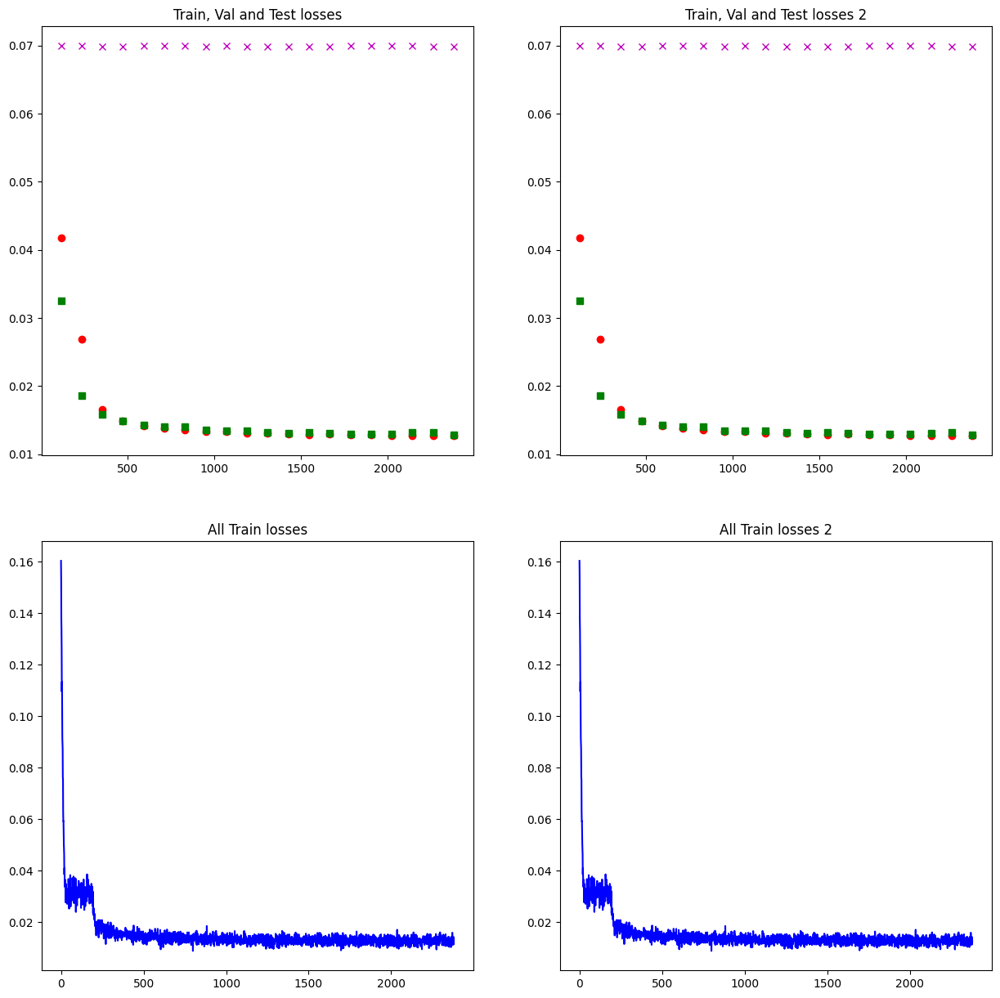

In [43]:
# to store losses for all epochs / iterations
dlossesTR[test_name]     = losses_TR
dlossesTR2[test_name]    = losses_TR2
dlossesTRAll[test_name]  = losses_TRAll
dlossesTRAll2[test_name] = losses_TRAll2
dlossesVA[test_name]     = losses_VA
dlossesVA2[test_name]    = losses_VA2
dlossesTE[test_name]     = losses_TE
didxEpoch[test_name]     = idxEpoch
dbestAcc[test_name]      = bestAcc
dnbParam[test_name]      = count_parameters(net)

for n in ['autoencoder_lr0_1.0e-03']: # ajouter dans cette liste le nom des reseaux que vous tester 
    if n in dlossesTR:
        print ('----------------------------------------------------------------------------')
        print ('----------------------------------------------------------------------------')
        print ('----------------------------------------------------------------------------')
        print (n)
        print ('best accuracy        : ' + str(dbestAcc[n].item()))
        print ('best loss on train   : ' + str(np.min(dlossesTR[n]))  + ' idx ' + str(np.argmin(dlossesTR[n])))
        print ('best loss on train 2 : ' + str(np.min(dlossesTR2[n])) + ' idx ' + str(np.argmin(dlossesTR2[n])))
        print ('best loss on val     : ' + str(np.min(dlossesVA[n]))  + ' idx ' + str(np.argmin(dlossesVA[n])))
        print ('best loss on val 2   : ' + str(np.min(dlossesVA2[n])) + ' idx ' + str(np.argmin(dlossesVA2[n])))
        print ('best loss on test    : ' + str(np.min(dlossesTE[n]))  + ' idx ' + str(np.argmin(dlossesTE[n])))
        print ('n param              : ' + str(dnbParam[n]))

        # evenly sampled time at 200ms intervals
        t = np.arange(0, len(dlossesTRAll[n]))

        _, axes = plt.subplots(2,2, figsize=(15,15))
        
        axes[0,0].set_title("Train, Val and Test losses")
        axes[0,1].set_title("Train, Val and Test losses 2")
        axes[1,0].set_title("All Train losses")
        axes[1,1].set_title("All Train losses 2")
        
        axes[0,0].plot(didxEpoch[n][1:], dlossesTR[n], 'ro', didxEpoch[n][1:], dlossesVA[n], 'gs', didxEpoch[n][1:], dlossesTE[n], 'mx')
        axes[0,1].plot(didxEpoch[n][1:], dlossesTR2[n], 'ro', didxEpoch[n][1:], dlossesVA2[n], 'gs', didxEpoch[n][1:], dlossesTE[n], 'mx')
        axes[1,0].plot(t, dlossesTRAll[n], 'b')
        axes[1,1].plot(t, dlossesTRAll2[n], 'b')
        
        plt.show()